<div style="
    background: linear-gradient(90deg,rgb(251, 255, 10), #ff758c, #ff4d6d);
    -webkit-background-clip: text;
    -webkit-text-fill-color: transparent;
    font-size: 20px;
    font-weight: bold;
    text-align: center;">
    Computer Vision
</div>



* Computer vision is one of the fields of artificial intelligence that trains and enables computers to understand the visual world.

* Computers can use digital image and deep learning models to accurately identify and classify objects and react to them.

* Computer vision in AI is dedicated to the development of automated systems that can interpret visual data (such as photographs or motion pictures) in the same manner as people do.

* 3R's of computer vision
    * `Recognition` : Thi process involves assigning digital lables to objects within the image.
    * `Recontruction` : This process refers to 3D scene rendering given inputs from particular viual images by encorporating multiple viewpoints, digital shading, and sensory depth data.
    * `Reorganization` : This process refers to row pixel segmentation into data  groups that represent the desired of predetermined configurations. Low level vision tasks include corner detection, edges detection, and contours; while high level vision tasks include sementic segmentation which can partly overlap with recognition process.

#### OpenCV-Python (cv2) Notes
* OpenCV (Open Source Computer Vision Library) is an open-source library for computer vision, machine learning, and image processing. In Python, it is accessed using the `cv2` module.

---

#### Installation
```bash
pip install opencv-python opencv-python-headless
```

---

#### Basic Operations

##### Reading and Displaying Images
```python
import cv2

### Read an image
image = cv2.imread("image.jpg")

### Display the image
cv2.imshow("Image", image)
cv2.waitKey(0)  ### Wait for key press
cv2.destroyAllWindows()  ### Close windows
```

##### Writing Images
```python
cv2.imwrite("output.jpg", image)
```

##### Video Capture
```python
### Capture from webcam
cap = cv2.VideoCapture(0)
while True:
    ret, frame = cap.read()
    if not ret:
        break
    cv2.imshow("Frame", frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()
```

---

#### Image Processing Operations

##### Resizing
```python
resized = cv2.resize(image, (width, height))
```

##### Converting Color Spaces
```python
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
```

##### Drawing Shapes
```python
### Line
cv2.line(image, (x1, y1), (x2, y2), color=(255, 0, 0), thickness=2)

### Rectangle
cv2.rectangle(image, (x1, y1), (x2, y2), color=(0, 255, 0), thickness=2)

### Circle
cv2.circle(image, (center_x, center_y), radius, color=(0, 0, 255), thickness=-1)  ### Thickness=-1 fills the circle
```

##### Adding Text
```python
cv2.putText(image, "Text", (x, y), cv2.FONT_HERSHEY_SIMPLEX, fontScale=1, color=(0, 255, 0), thickness=2)
```

---

#### Thresholding

##### Simple Thresholding
```python
_, binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
```

##### Adaptive Thresholding
```python
adaptive = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
```

---

#### Edge Detection
```python
edges = cv2.Canny(image, 100, 200)
```

---

#### Contour Detection
```python
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
_, threshold = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(threshold, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(image, contours, -1, (0, 255, 0), 3)
```

---

#### Morphological Operations
```python
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))

### Dilation
dilated = cv2.dilate(binary, kernel, iterations=1)

### Erosion
eroded = cv2.erode(binary, kernel, iterations=1)

### Opening
opened = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)

### Closing
closed = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)
```

---

#### Blurring

##### Gaussian Blur
```python
g_blur = cv2.GaussianBlur(image, (5, 5), 0)
```

##### Median Blur
```python
m_blur = cv2.medianBlur(image, 5)
```

##### Bilateral Filtering
```python
bilateral = cv2.bilateralFilter(image, 9, 75, 75)
```

---

#### Geometric Transformations

##### Rotation
```python
(h, w) = image.shape[:2]
center = (w // 2, h // 2)
M = cv2.getRotationMatrix2D(center, angle=45, scale=1.0)
rotated = cv2.warpAffine(image, M, (w, h))
```

##### Translation
```python
M = np.float32([[1, 0, tx], [0, 1, ty]])
translated = cv2.warpAffine(image, M, (width, height))
```

##### Affine Transformation
```python
pts1 = np.float32([[50, 50], [200, 50], [50, 200]])
pts2 = np.float32([[10, 100], [200, 50], [100, 250]])
M = cv2.getAffineTransform(pts1, pts2)
affine = cv2.warpAffine(image, M, (cols, rows))
```

##### Perspective Transformation
```python
pts1 = np.float32([[56, 65], [368, 52], [28, 387], [389, 390]])
pts2 = np.float32([[0, 0], [300, 0], [0, 300], [300, 300]])
M = cv2.getPerspectiveTransform(pts1, pts2)
warped = cv2.warpPerspective(image, M, (300, 300))
```

---

#### Image Arithmetic

##### Adding Images
```python
added = cv2.add(image1, image2)
```

##### Blending Images
```python
blended = cv2.addWeighted(image1, alpha, image2, beta, gamma)
```

---

#### Template Matching
```python
template = cv2.imread("template.jpg", 0)
res = cv2.matchTemplate(gray, template, cv2.TM_CCOEFF_NORMED)
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
(top_left_x, top_left_y) = max_loc
(h, w) = template.shape[:2]
cv2.rectangle(image, (top_left_x, top_left_y), (top_left_x + w, top_left_y + h), (255, 0, 0), 2)
```

---

#### Tips and Best Practices
- Always check the shape of an image using `image.shape`.
- Normalize pixel values if required for ML models: `image = image / 255.0`.
- To handle videos, ensure the codec is set when saving files.
 

In [1]:
!pip install seaborn

In [2]:
!pip install opencv-python pillow scikit-image

<div style="
    background: linear-gradient(90deg,rgb(251, 255, 10), #ff758c, #ff4d6d);
    -webkit-background-clip: text;
    -webkit-text-fill-color: transparent;
    font-size: 17px;
    font-weight: bold;
    text-align: center;">
-----------------------------------------------------------------------------------------------------------------------------------------
</br>
Using cv2
</div>


In [3]:
import cv2
import warnings

warnings.filterwarnings('ignore')

In [4]:
img = cv2.imread('content\images\lenna.png')
print(type(img))
cv2.imshow('lenna', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

<class 'numpy.ndarray'>


In [5]:
img = cv2.imread('content\images\sachin.jpg')
cv2.imshow('sachin', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

cv2.imwrite('image_cv2.jpg', img)

print(img.shape)

(1075, 850, 3)


In [6]:
!del image_cv2.jpg

In [7]:
img

array([[[ 26,  19,  16],
        [ 26,  19,  16],
        [ 26,  19,  16],
        ...,
        [ 33,  26,  23],
        [ 31,  28,  24],
        [ 31,  28,  24]],

       [[ 26,  19,  16],
        [ 26,  19,  16],
        [ 26,  19,  16],
        ...,
        [ 33,  26,  23],
        [ 29,  26,  22],
        [ 29,  26,  22]],

       [[ 26,  19,  16],
        [ 26,  19,  16],
        [ 26,  19,  16],
        ...,
        [ 33,  26,  23],
        [ 31,  24,  21],
        [ 31,  24,  21]],

       ...,

       [[131, 188, 197],
        [132, 189, 198],
        [131, 190, 199],
        ...,
        [103, 140, 138],
        [102, 137, 133],
        [104, 137, 133]],

       [[132, 189, 198],
        [133, 190, 199],
        [132, 191, 200],
        ...,
        [101, 138, 136],
        [102, 136, 136],
        [104, 135, 136]],

       [[133, 190, 199],
        [134, 191, 200],
        [133, 192, 201],
        ...,
        [100, 136, 136],
        [102, 135, 138],
        [104, 134, 139]]

<div style="
    background: linear-gradient(90deg,rgb(251, 255, 10), #ff758c, #ff4d6d);
    -webkit-background-clip: text;
    -webkit-text-fill-color: transparent;
    font-size: 17px;
    font-weight: bold;
    text-align: center;">
-----------------------------------------------------------------------------------------------------------------------------------------
</br>
Using matplotlib
</div>


In [8]:
import matplotlib.pyplot as plt

<class 'numpy.ndarray'>


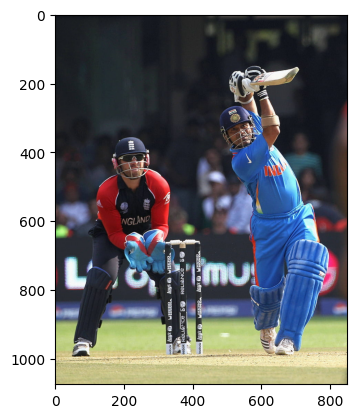

In [9]:
img = plt.imread('content\images\sachin.jpg')
plt.imshow(img)
print(type(img))

cv2.imshow('sachin', img)
cv2.waitKey(0)
cv2.destroyAllWindows()


plt.imsave('image_plt.jpg', img)


In [10]:
!del image_plt.jpg

<div style="
    background: linear-gradient(90deg,rgb(251, 255, 10), #ff758c, #ff4d6d);
    -webkit-background-clip: text;
    -webkit-text-fill-color: transparent;
    font-size: 17px;
    font-weight: bold;
    text-align: center;">
-----------------------------------------------------------------------------------------------------------------------------------------
</br>
Using Scikit Image
</div>


In [11]:
from skimage import io

<class 'numpy.ndarray'>


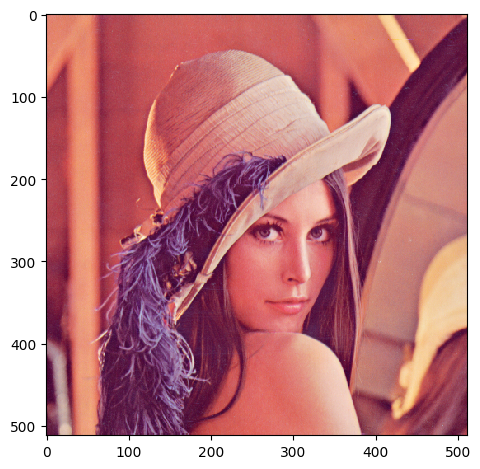

In [12]:
img = io.imread('content\images\lenna.png')
print(type(img))
io.imshow(img)

io.imsave('image_skl.jpg', img)

In [13]:
!del image_skl.jpg

<div style="
    background: linear-gradient(90deg,rgb(251, 255, 10), #ff758c, #ff4d6d);
    -webkit-background-clip: text;
    -webkit-text-fill-color: transparent;
    font-size: 17px;
    font-weight: bold;
    text-align: center;">
-----------------------------------------------------------------------------------------------------------------------------------------
</br>
Using PIL
</div>


In [14]:
from PIL import Image

In [17]:
img = Image.open('content\images\lenna.png')
print(type(img))

img.show()

img.save('image_pil.jpg', 'JPEG')

<class 'PIL.PngImagePlugin.PngImageFile'>


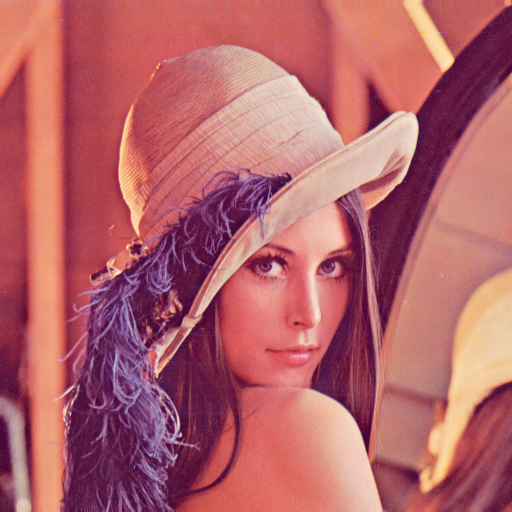

In [ ]:
img

In [18]:
!del image_pil.jpg

<div style="
    background: linear-gradient(90deg,rgb(251, 255, 10), #ff758c, #ff4d6d);
    -webkit-background-clip: text;
    -webkit-text-fill-color: transparent;
    font-size: 17px;
    font-weight: bold;
    text-align: center;">
-----------------------------------------------------------------------------------------------------------------------------------------
</br>
Using Tensorflow
</div>


In [19]:
import tensorflow as tf

<class 'tensorflow.python.framework.ops.EagerTensor'>


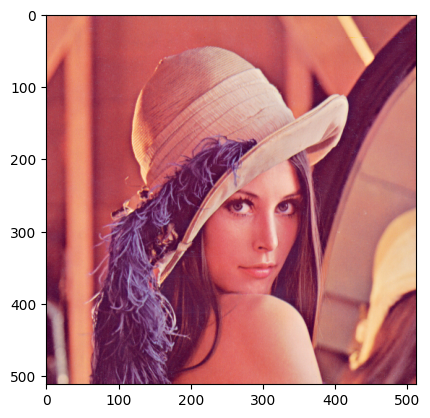

In [20]:
img = tf.io.read_file('content\images\lenna.png')
img = tf.io.decode_image(img)

print(type(img))
plt.imshow(img)

(3,)


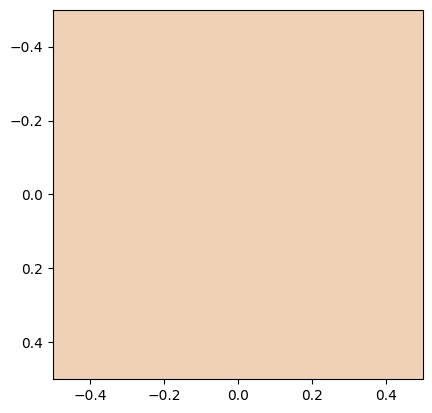

In [21]:
new = img[345,500]
print(new.shape)

new  = new.numpy().reshape(1,1,3)
plt.imshow(new)

<div style="
    background: linear-gradient(90deg,rgb(251, 255, 10), #ff758c, #ff4d6d);
    -webkit-background-clip: text;
    -webkit-text-fill-color: transparent;
    font-size: 17px;
    font-weight: bold;
    text-align: center;">
-----------------------------------------------------------------------------------------------------------------------------------------
</br>
    Grayscale Image
</div>


(512, 512)


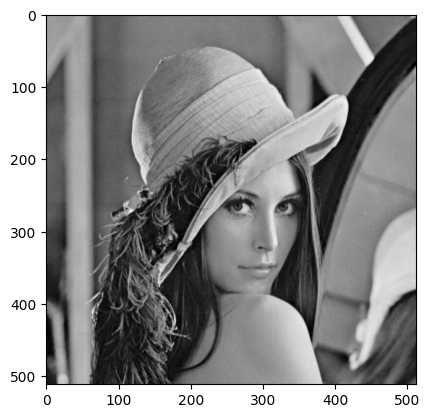

In [22]:
img = cv2.imread('content\images\lenna.png',0)
print(img.shape)
plt.imshow(img, cmap='gray')

(512, 512)


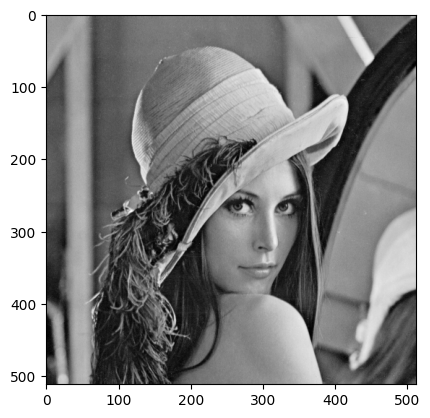

In [23]:
img = cv2.imread('content\images\lenna.png')
img1 = cv2.cvtColor(img ,cv2.COLOR_BGR2GRAY)
print(img1.shape)
plt.imshow(img1, cmap='gray')

<div style="
    background: linear-gradient(90deg,rgb(251, 255, 10), #ff758c, #ff4d6d);
    -webkit-background-clip: text;
    -webkit-text-fill-color: transparent;
    font-size: 17px;
    font-weight: bold;
    text-align: center;">
-----------------------------------------------------------------------------------------------------------------------------------------
</br>
    Image Operations using array
</div>


In [24]:
import numpy as np

In [25]:
zeros = np.zeros([500,500], dtype=np.uint8)
print(zeros.shape)
print(zeros)

(500, 500)
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


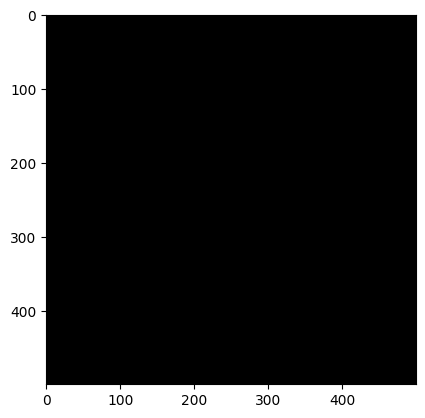

In [26]:
plt.imshow(zeros, cmap='gray')

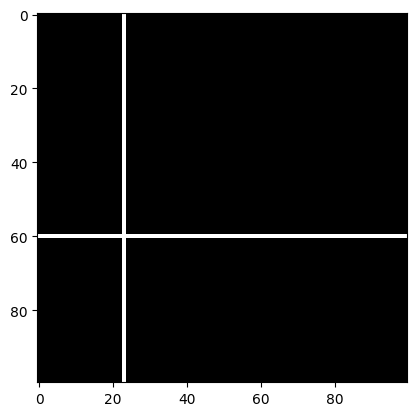

In [27]:
zeros = np.zeros([100,100], dtype=np.uint8)
zeros[60] = 255
zeros[:,23] = 255
plt.imshow(zeros, cmap='gray')

In [28]:
img = plt.imread('content\images\lenna.png') 
print(img.shape)
R,G,B = img[:,:,0], img[:,:,1], img[:,:,2]

(512, 512, 3)


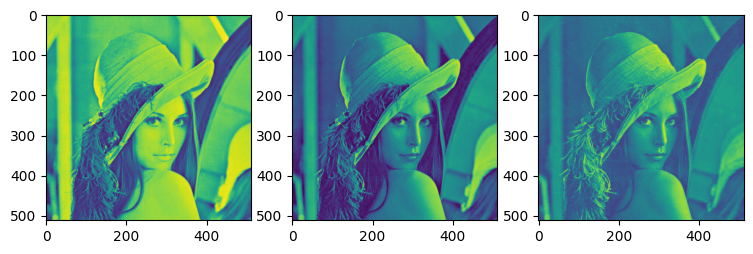

In [29]:
plt.figure(figsize=(9,16))

plt.subplot(1,3,1)
plt.imshow(R)
plt.subplot(1,3,2)
plt.imshow(G)
plt.subplot(1,3,3)
plt.imshow(B)

plt.show()

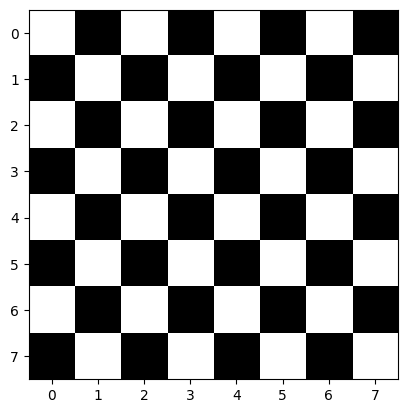

In [30]:
board = np.zeros([8,8], dtype=np.uint8)
for row in range(board.shape[0]):
    for col in range(board.shape[1]):
        if (row+col) % 2 == 0:
            board[row,col] = 255
plt.imshow(board, cmap='gray')

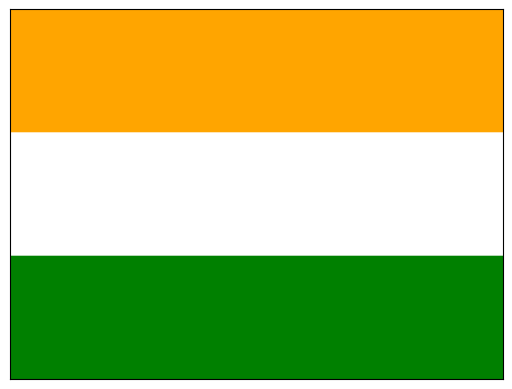

In [31]:
flag = np.zeros([300,400,3], dtype=np.uint8)
flag[:100,:] = [255,165,0]
flag[100:200,:] = [255,255,255]
flag[200:300,:] = [0,128,0]
plt.xticks([])
plt.yticks([])
plt.imshow(flag)


flad = flag.astype(np.uint8)
plt.imsave('tricolor.jpg', flag)

In [32]:
!del tricolor.jpg

(956, 1838, 4)


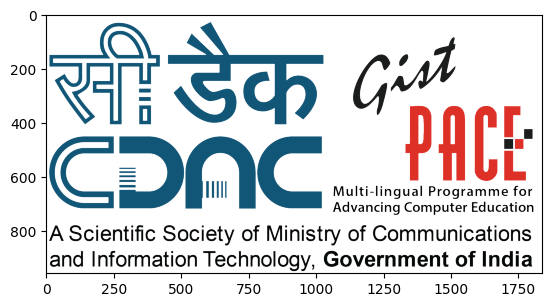

In [33]:
logo = plt.imread('content\images\CDAC_LOGO.png')
print(logo.shape)
plt.imshow(logo)

<div style="
    background: linear-gradient(90deg,rgb(251, 255, 10), #ff758c, #ff4d6d);
    -webkit-background-clip: text;
    -webkit-text-fill-color: transparent;
    font-size: 17px;
    font-weight: bold;
    text-align: center;">
-----------------------------------------------------------------------------------------------------------------------------------------
</br>
    Color Channels
</div>


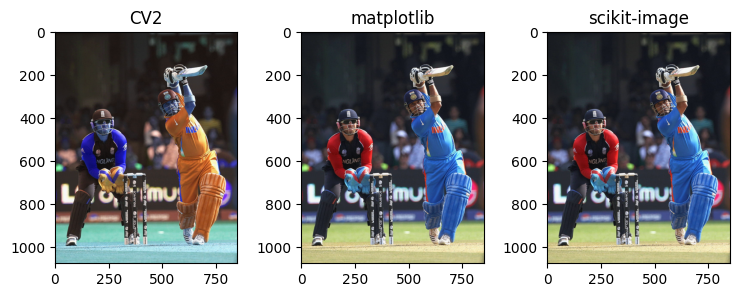

In [36]:
img_cv = cv2.imread('content\images\sachin.jpg')
img_plt = plt.imread('content\images\sachin.jpg')
img_ski = io.imread('content\images\sachin.jpg')


plt.figure(figsize=(9,3))

plt.subplot(1,3,1)
plt.title('CV2')
plt.imshow(img_cv)


plt.subplot(1,3,2)
plt.title('matplotlib')
plt.imshow(img_plt)

plt.subplot(1,3,3)
plt.title('scikit-image')
plt.imshow(img_ski)

plt.show()

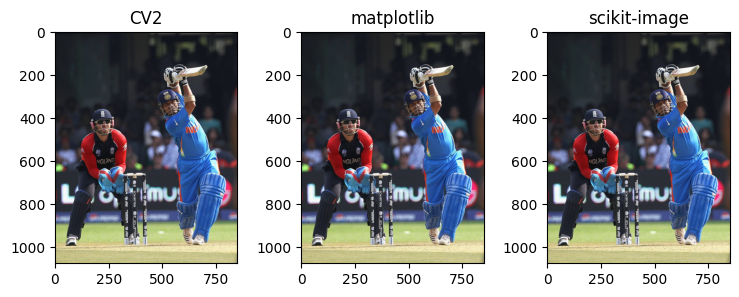

In [38]:
img_cv_rgb = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB) 


plt.figure(figsize=(9,3))

plt.subplot(1,3,1)
plt.title('CV2')
plt.imshow(img_cv_rgb)


plt.subplot(1,3,2)
plt.title('matplotlib')
plt.imshow(img_plt)

plt.subplot(1,3,3)
plt.title('scikit-image')
plt.imshow(img_ski)


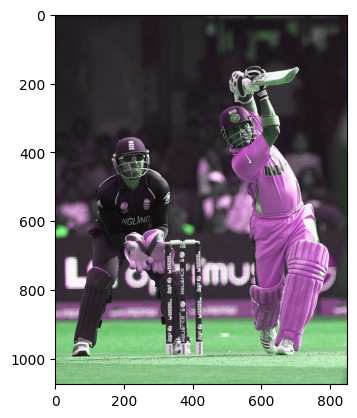

In [ ]:
img_cv_copy = img_cv
img_cv_copy[:,:,2], img_cv_copy[:,:,0] = img_cv_copy[:,:,0],img_cv_copy[:,:,2]
plt.imshow(img_cv_copy)

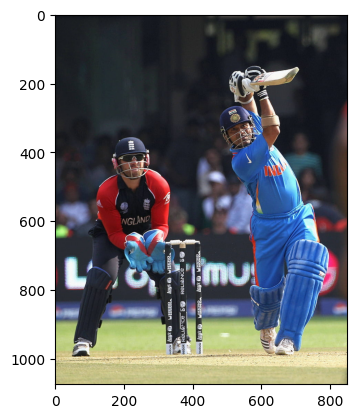

In [42]:
img_cv = cv2.imread('content\images\sachin.jpg')
b,g,r= cv2.split(img_cv)
rgb_img = cv2.merge([r,g,b])
plt.imshow(rgb_img)

<div style="
    background: linear-gradient(90deg,rgb(251, 255, 10), #ff758c, #ff4d6d);
    -webkit-background-clip: text;
    -webkit-text-fill-color: transparent;
    font-size: 17px;
    font-weight: bold;
    text-align: center;">
-----------------------------------------------------------------------------------------------------------------------------------------
</br>
    ColorMap
</div>



* It is a predefined set of colors that are mapped to numerical values within an image.

* It acts as a translator, converting numerical data into visually interpretable colors.

* OpenCv offers a diverse palette of built-in colormaps, each catering to specific visualization needs.

* Types
    * Sequentail
    * Diverging
    * Cyclic
    * Qualitative
    * Miscellaneous

In [2]:
import cv2
import matplotlib.pyplot as plt

In [12]:
img = cv2.imread('content\images\sachin.jpg',0)
print(img.shape)


(1075, 850)


<>:1: SyntaxWarning: invalid escape sequence '\i'
<>:1: SyntaxWarning: invalid escape sequence '\i'
C:\Users\DAI.STUDENTSDC\AppData\Local\Temp\ipykernel_19684\151721348.py:1: SyntaxWarning: invalid escape sequence '\i'
  img = cv2.imread('content\images\sachin.jpg',0)


$$\text{Sequential colormap}$$

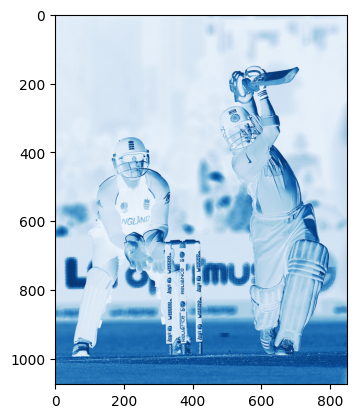

In [13]:
plt.imshow(img, cmap='Blues')

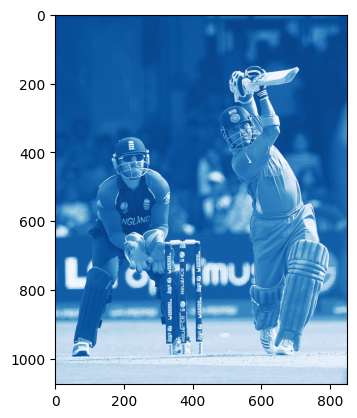

In [14]:
orig_map = plt.colormaps['Blues']
reversed_map = orig_map.reversed()
plt.imshow(img, cmap=reversed_map)

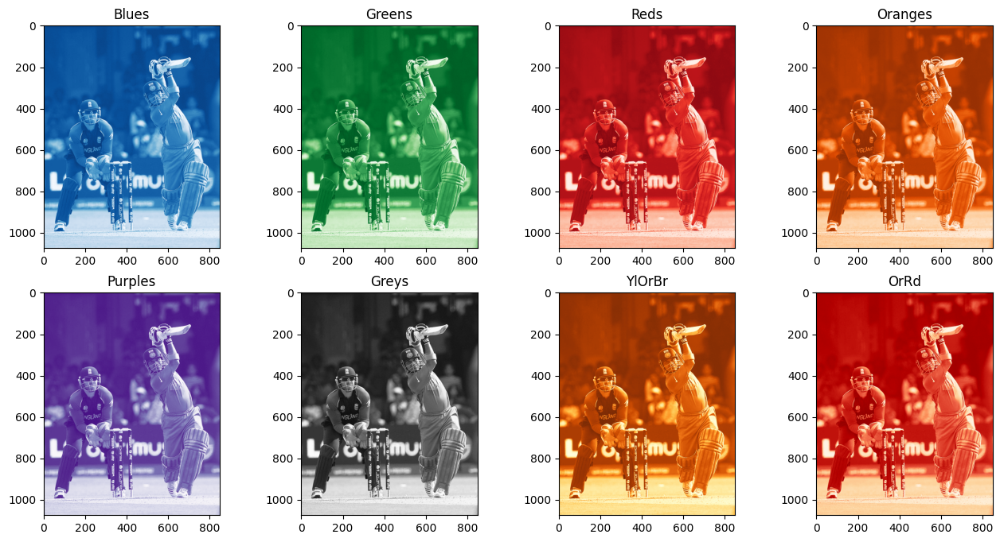

In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(2,4,1) 
plt.title('Blues')
plt.imshow(img, cmap= plt.colormaps['Blues'].reversed())
plt.subplot(2,4,2) 
plt.title('Greens')
plt.imshow(img, cmap= plt.colormaps['Greens'].reversed())
plt.subplot(2,4,3) 
plt.title('Reds')
plt.imshow(img, cmap= plt.colormaps['Reds'].reversed())
plt.subplot(2,4,4) 
plt.title('Oranges')
plt.imshow(img, cmap= plt.colormaps['Oranges'].reversed())
plt.subplot(2,4,5) 
plt.title('Purples')
plt.imshow(img, cmap= plt.colormaps['Purples'].reversed())
plt.subplot(2,4,6) 
plt.title('Greys')
plt.imshow(img, cmap= plt.colormaps['Greys'].reversed())
plt.subplot(2,4,7) 
plt.title('YlOrBr')
plt.imshow(img, cmap= plt.colormaps['YlOrBr'].reversed())
plt.subplot(2,4,8) 
plt.title('OrRd')
plt.imshow(img, cmap= plt.colormaps['OrRd'].reversed())

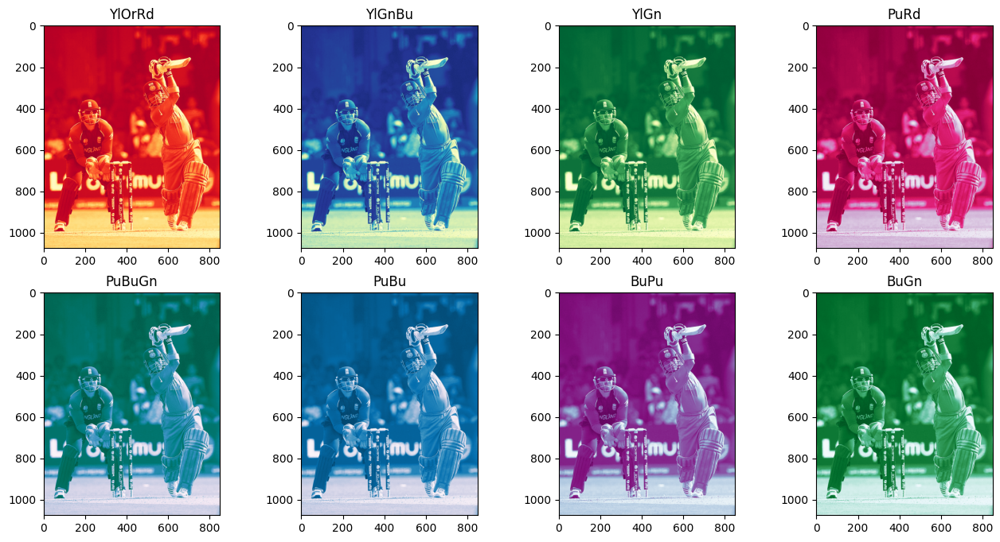

In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(2,4,1) 
plt.title('YlOrRd')
plt.imshow(img, cmap= plt.colormaps['YlOrRd'].reversed())
plt.subplot(2,4,2) 
plt.title('YlGnBu')
plt.imshow(img, cmap= plt.colormaps['YlGnBu'].reversed())
plt.subplot(2,4,3) 
plt.title('YlGn')
plt.imshow(img, cmap= plt.colormaps['YlGn'].reversed())
plt.subplot(2,4,4) 
plt.title('PuRd')
plt.imshow(img, cmap= plt.colormaps['PuRd'].reversed())
plt.subplot(2,4,5)  
plt.title('PuBuGn')
plt.imshow(img, cmap= plt.colormaps['PuBuGn'].reversed())
plt.subplot(2,4,6) 
plt.title('PuBu')
plt.imshow(img, cmap= plt.colormaps['PuBu'].reversed())
plt.subplot(2,4,7) 
plt.title('BuPu')
plt.imshow(img, cmap= plt.colormaps['BuPu'].reversed())
plt.subplot(2,4,8) 
plt.title('BuGn')
plt.imshow(img, cmap= plt.colormaps['BuGn'].reversed())

$$\text{Diverging colormap}$$

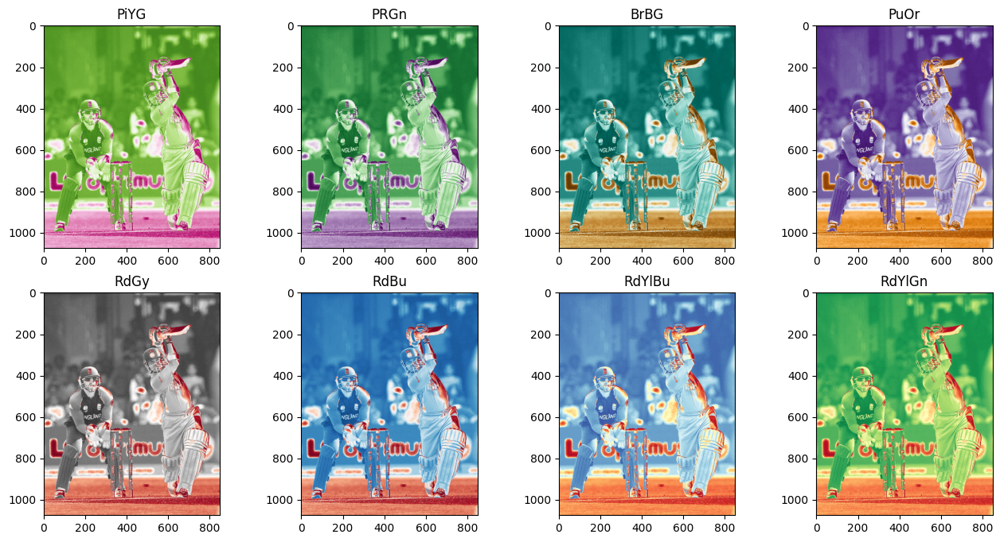

In [22]:
plt.figure(figsize=(16,8))
plt.subplot(2,4,1) 
plt.title('PiYG')
plt.imshow(img, cmap= plt.colormaps['PiYG'].reversed())
plt.subplot(2,4,2) 
plt.title('PRGn')
plt.imshow(img, cmap= plt.colormaps['PRGn'].reversed())
plt.subplot(2,4,3) 
plt.title('BrBG')
plt.imshow(img, cmap= plt.colormaps['BrBG'].reversed())
plt.subplot(2,4,4) 
plt.title('PuOr')
plt.imshow(img, cmap= plt.colormaps['PuOr'].reversed())
plt.subplot(2,4,5)  
plt.title('RdGy')
plt.imshow(img, cmap= plt.colormaps['RdGy'].reversed())
plt.subplot(2,4,6) 
plt.title('RdBu')
plt.imshow(img, cmap= plt.colormaps['RdBu'].reversed())
plt.subplot(2,4,7) 
plt.title('RdYlBu')
plt.imshow(img, cmap= plt.colormaps['RdYlBu'].reversed())
plt.subplot(2,4,8) 
plt.title('RdYlGn')
plt.imshow(img, cmap= plt.colormaps['RdYlGn'].reversed())

$$\text{Cyclic colormap}$$

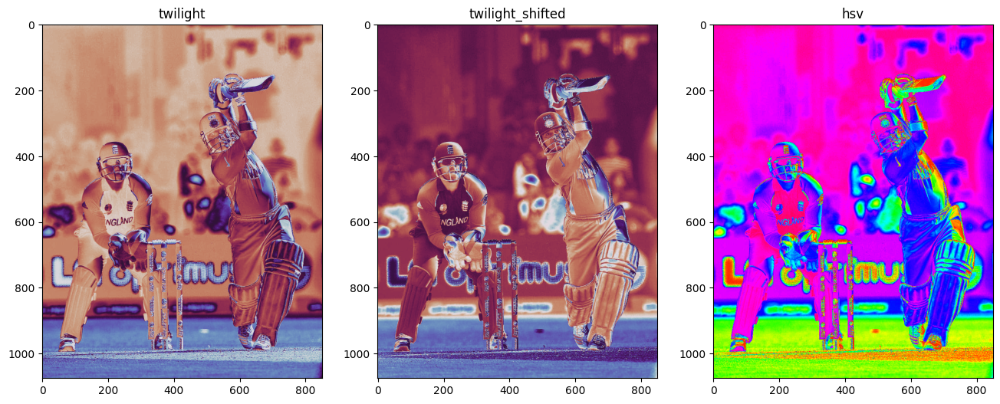

In [25]:
plt.figure(figsize=(16,8))
plt.subplot(1,3,1) 
plt.title('twilight')
plt.imshow(img, cmap= plt.colormaps['twilight'].reversed())
plt.subplot(1,3,2) 
plt.title('twilight_shifted')
plt.imshow(img, cmap= plt.colormaps['twilight_shifted'].reversed())
plt.subplot(1,3,3) 
plt.title('hsv')
plt.imshow(img, cmap= plt.colormaps['hsv'].reversed()) 

$$\text{Qualitative colormap}$$

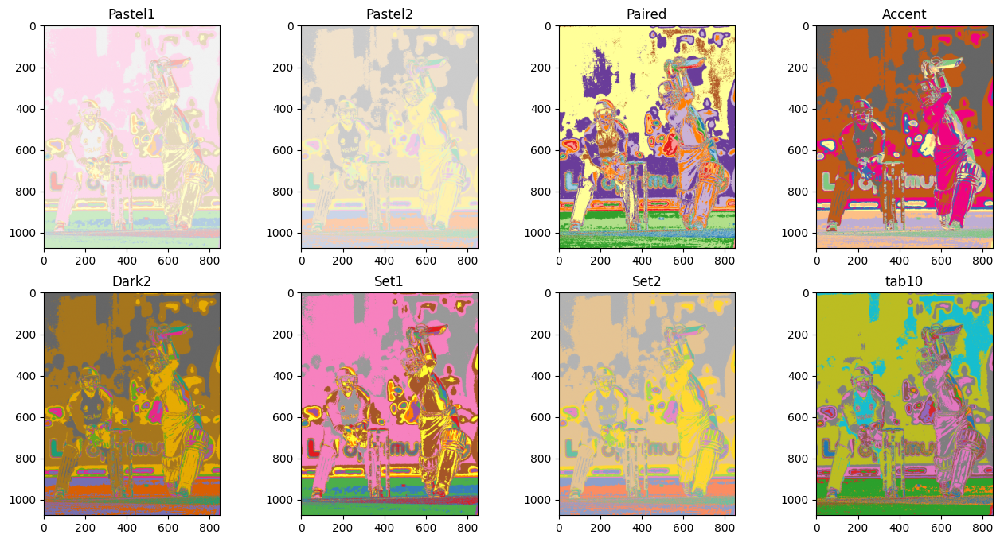

In [26]:
plt.figure(figsize=(16,8))
plt.subplot(2,4,1) 
plt.title('Pastel1')
plt.imshow(img, cmap= plt.colormaps['Pastel1'].reversed())
plt.subplot(2,4,2) 
plt.title('Pastel2')
plt.imshow(img, cmap= plt.colormaps['Pastel2'].reversed())
plt.subplot(2,4,3) 
plt.title('Paired')
plt.imshow(img, cmap= plt.colormaps['Paired'].reversed())
plt.subplot(2,4,4) 
plt.title('Accent')
plt.imshow(img, cmap= plt.colormaps['Accent'].reversed())
plt.subplot(2,4,5) 
plt.title('Dark2')
plt.imshow(img, cmap= plt.colormaps['Dark2'].reversed())
plt.subplot(2,4,6) 
plt.title('Set1')
plt.imshow(img, cmap= plt.colormaps['Set1'].reversed())
plt.subplot(2,4,7) 
plt.title('Set2')
plt.imshow(img, cmap= plt.colormaps['Set2'].reversed())
plt.subplot(2,4,8) 
plt.title('tab10')
plt.imshow(img, cmap= plt.colormaps['tab10'].reversed())

$$\text{Miscellaneous colormap}$$

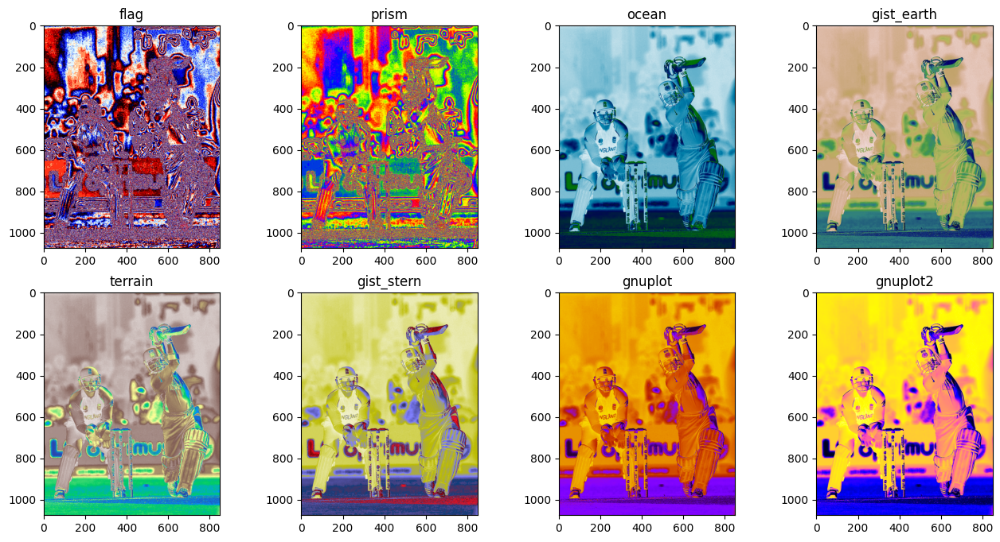

In [28]:
plt.figure(figsize=(16,8))
plt.subplot(2,4,1) 
plt.title('flag')
plt.imshow(img, cmap= plt.colormaps['flag'].reversed())
plt.subplot(2,4,2) 
plt.title('prism')
plt.imshow(img, cmap= plt.colormaps['prism'].reversed())
plt.subplot(2,4,3) 
plt.title('ocean')
plt.imshow(img, cmap= plt.colormaps['ocean'].reversed())
plt.subplot(2,4,4) 
plt.title('gist_earth')
plt.imshow(img, cmap= plt.colormaps['gist_earth'].reversed())
plt.subplot(2,4,5) 
plt.title('terrain')
plt.imshow(img, cmap= plt.colormaps['terrain'].reversed())
plt.subplot(2,4,6) 
plt.title('gist_stern')
plt.imshow(img, cmap= plt.colormaps['gist_stern'].reversed())
plt.subplot(2,4,7) 
plt.title('gnuplot')
plt.imshow(img, cmap= plt.colormaps['gnuplot'].reversed())
plt.subplot(2,4,8) 
plt.title('gnuplot2')
plt.imshow(img, cmap= plt.colormaps['gnuplot2'].reversed())
 